# Food-101 EDA — NutriVision Dataset Exploration

Exploratory Data Analysis of the [Food-101](https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/) dataset.
Goal: understand structure, class balance, image statistics, and quality before training a ViT-based food classifier.

**Dataset:** 101 food categories · 75,750 train images · 25,250 test images · ~101,000 total

## 1 — Setup & Imports

In [1]:
import json
import math
import random
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image, ImageOps, UnidentifiedImageError

# ── Paths: walk up until data/food-101 is found (works from any CWD) ─────────
def _find_repo_root() -> Path:
    for p in [Path().resolve(), *Path().resolve().parents]:
        if (p / "data" / "food-101").exists():
            return p
    raise FileNotFoundError("Cannot locate data/food-101 from CWD; run from project root.")

DATA_ROOT = _find_repo_root() / "data" / "food-101"
assert DATA_ROOT.exists(), f"DATA_ROOT not found: {DATA_ROOT}"

TRAIN_DIR = DATA_ROOT / "train"
TEST_DIR  = DATA_ROOT / "test"
META_DIR  = DATA_ROOT / "meta"

# ── Reproducibility ───────────────────────────────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

plt.rcParams.update({"figure.dpi": 100, "axes.titlesize": 11})
print(f"DATA_ROOT: {DATA_ROOT}  (exists={DATA_ROOT.exists()})")

DATA_ROOT: /home/aoi/Projects/nutri_vision/data/food-101  (exists=True)


## 2 — Dataset Overview

Count images per class per split and confirm totals against the expected 75,750 / 25,250 split.

In [2]:
# Count JPEG images per class in train and test splits
def count_images(split_dir: Path) -> dict[str, int]:
    """Return {class_name: image_count} for all subdirectories."""
    return {
        cls.name: len(list(cls.glob("*.jpg")))
        for cls in sorted(split_dir.iterdir())
        if cls.is_dir()
    }

train_counts = count_images(TRAIN_DIR)
test_counts  = count_images(TEST_DIR)

df = pd.DataFrame({"train": train_counts, "test": test_counts})
df["total"] = df["train"] + df["test"]

print(f"Classes   : {len(df)}")
print(f"Train imgs: {df['train'].sum():,}  (expected 75,750)")
print(f"Test  imgs: {df['test'].sum():,}  (expected 25,250)")
print(f"Total     : {df['total'].sum():,}")
df.describe().T

Classes   : 101
Train imgs: 75,750  (expected 75,750)
Test  imgs: 25,250  (expected 25,250)
Total     : 101,000


,count,mean,std,min,25%,50%,75%,max
train,101.0,750.0,0.0,750.0,750.0,750.0,750.0,750.0
test,101.0,250.0,0.0,250.0,250.0,250.0,250.0,250.0
total,101.0,1000.0,0.0,1000.0,1000.0,1000.0,1000.0,1000.0


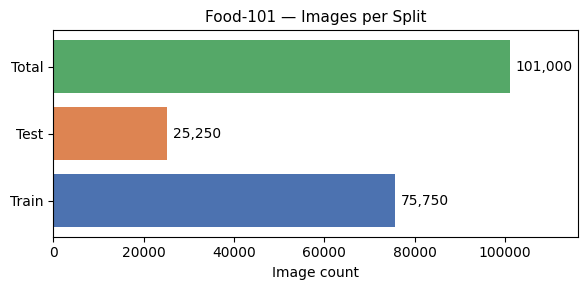

In [3]:
# Bar chart: train vs test totals
fig, ax = plt.subplots(figsize=(6, 3))
splits = ["Train", "Test", "Total"]
counts = [df["train"].sum(), df["test"].sum(), df["total"].sum()]
bars = ax.barh(splits, counts, color=["#4C72B0", "#DD8452", "#55A868"])
ax.bar_label(bars, fmt="{:,.0f}", padding=4)
ax.set_xlabel("Image count")
ax.set_title("Food-101 — Images per Split")
ax.set_xlim(0, max(counts) * 1.15)
plt.tight_layout()
plt.show()

## 3 — Class Exploration

List all 101 food categories and visualise one sample image per class for the first 25 classes.

In [4]:
# Load sorted class list from meta/classes.txt
classes: list[str] = (META_DIR / "classes.txt").read_text().splitlines()

# Display as a 4-column table via DataFrame
n_cols = 4
padded = classes + [""] * (-len(classes) % n_cols)  # pad to multiple of n_cols
class_df = pd.DataFrame(
    np.array(padded).reshape(-1, n_cols),
    columns=[f"Class {i+1}" for i in range(n_cols)]
)
print(f"Total classes: {len(classes)}")
class_df

Total classes: 101


,Class 1,Class 2,Class 3,Class 4
0,apple_pie,baby_back_ribs,baklava,beef_carpaccio
1,beef_tartare,beet_salad,beignets,bibimbap
2,bread_pudding,breakfast_burrito,bruschetta,caesar_salad
3,cannoli,caprese_salad,carrot_cake,ceviche
4,cheesecake,cheese_plate,chicken_curry,chicken_quesadilla
5,chicken_wings,chocolate_cake,chocolate_mousse,churros
6,clam_chowder,club_sandwich,crab_cakes,creme_brulee
7,croque_madame,cup_cakes,deviled_eggs,donuts
8,dumplings,edamame,eggs_benedict,escargots
9,falafel,filet_mignon,fish_and_chips,foie_gras


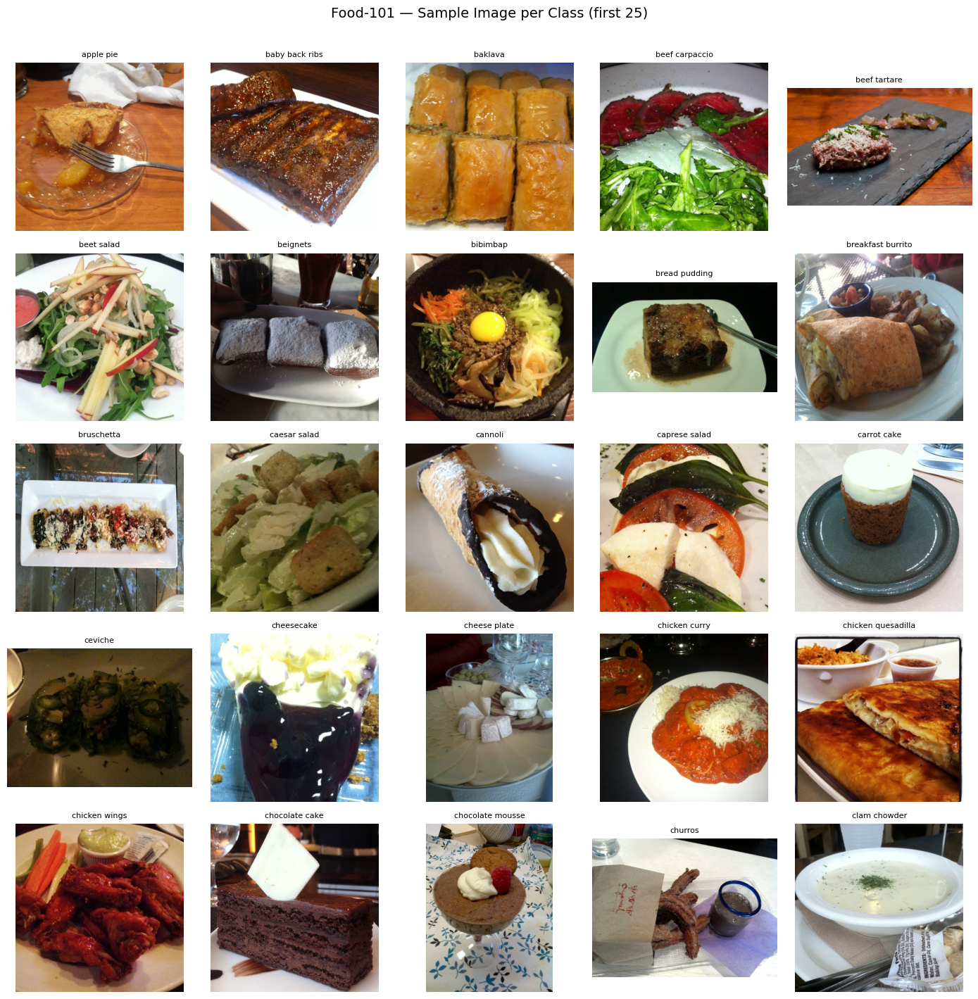

In [5]:
# 5×5 grid: one random train image from each of the first 25 classes
random.seed(SEED)  # re-seed for reproducibility independent of execution order
sample_classes = classes[:25]

fig, axes = plt.subplots(5, 5, figsize=(14, 14))
fig.suptitle("Food-101 — Sample Image per Class (first 25)", fontsize=14, y=1.01)

for ax, cls_name in zip(axes.flat, sample_classes):
    imgs = list((TRAIN_DIR / cls_name).glob("*.jpg"))
    try:
        img = Image.open(random.choice(imgs)).convert("RGB")
        ax.imshow(img)
    except Exception:
        ax.text(0.5, 0.5, "error", ha="center", va="center", transform=ax.transAxes)
    ax.set_title(cls_name.replace("_", " "), fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.show()

## 4 — Image Statistics

Sample 500 random training images and collect width, height, aspect ratio, and file size
to understand native resolution distribution before choosing a resize target.

In [6]:
# Collect stats from a random sample of 500 train images
SAMPLE_SIZE = 500

all_train_imgs = list(TRAIN_DIR.rglob("*.jpg"))
sample_paths = random.sample(all_train_imgs, min(SAMPLE_SIZE, len(all_train_imgs)))

stats: list[dict] = []
for p in sample_paths:
    try:
        with Image.open(p) as im:
            w, h = im.size
        stats.append({"width": w, "height": h,
                       "aspect": round(w / h, 3),
                       "filesize_kb": round(p.stat().st_size / 1024, 1)})
    except Exception:
        pass  # corrupt files handled in Section 7

stats_df = pd.DataFrame(stats)
print(f"Sampled {len(stats_df)} images")
stats_df[["width", "height", "aspect", "filesize_kb"]].describe().round(1)

Sampled 500 images


,width,height,aspect,filesize_kb
count,500.0,500.0,500.0,500.0
mean,489.1,477.1,1.1,49.1
std,54.6,66.3,0.2,16.3
min,287.0,287.0,0.6,14.6
25%,512.0,512.0,1.0,38.8
50%,512.0,512.0,1.0,47.2
75%,512.0,512.0,1.0,56.0
max,512.0,512.0,1.8,160.5


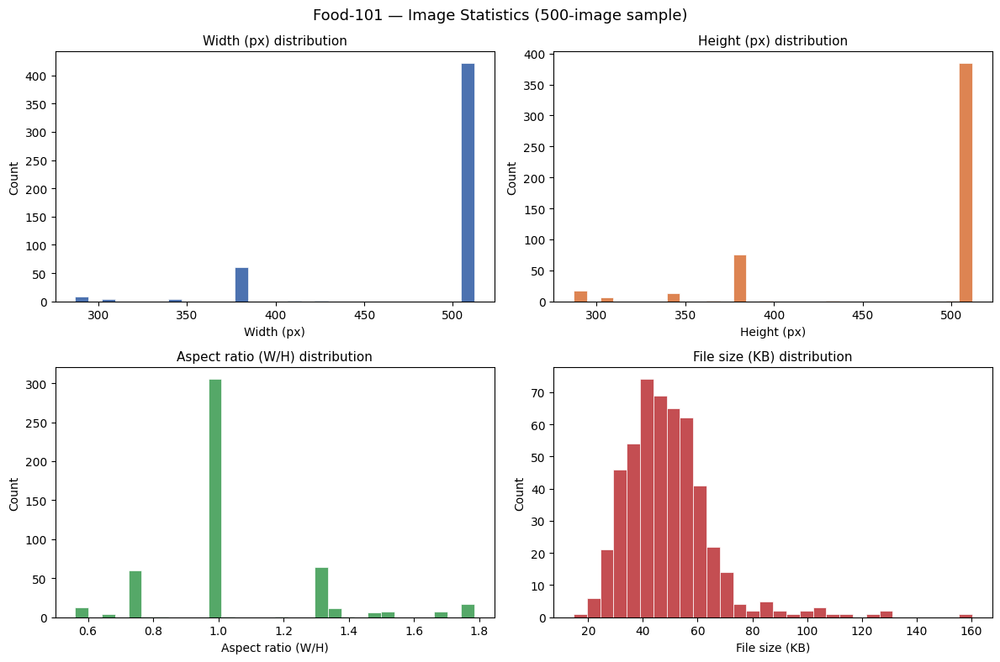

In [7]:
# 2×2 histogram grid: width, height, aspect ratio, file size
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle("Food-101 — Image Statistics (500-image sample)", fontsize=13)

specs = [
    ("width",       "Width (px)",         "#4C72B0"),
    ("height",      "Height (px)",        "#DD8452"),
    ("aspect",      "Aspect ratio (W/H)", "#55A868"),
    ("filesize_kb", "File size (KB)",     "#C44E52"),
]

for ax, (col, label, color) in zip(axes.flat, specs):
    ax.hist(stats_df[col], bins=30, color=color, edgecolor="white", linewidth=0.5)
    ax.set_xlabel(label)
    ax.set_ylabel("Count")
    ax.set_title(f"{label} distribution")

plt.tight_layout()
plt.show()

## 5 — Sample Visualisation

10×10 mosaic: one random image per class across all 101 classes (resized to 128×128 for uniform display).

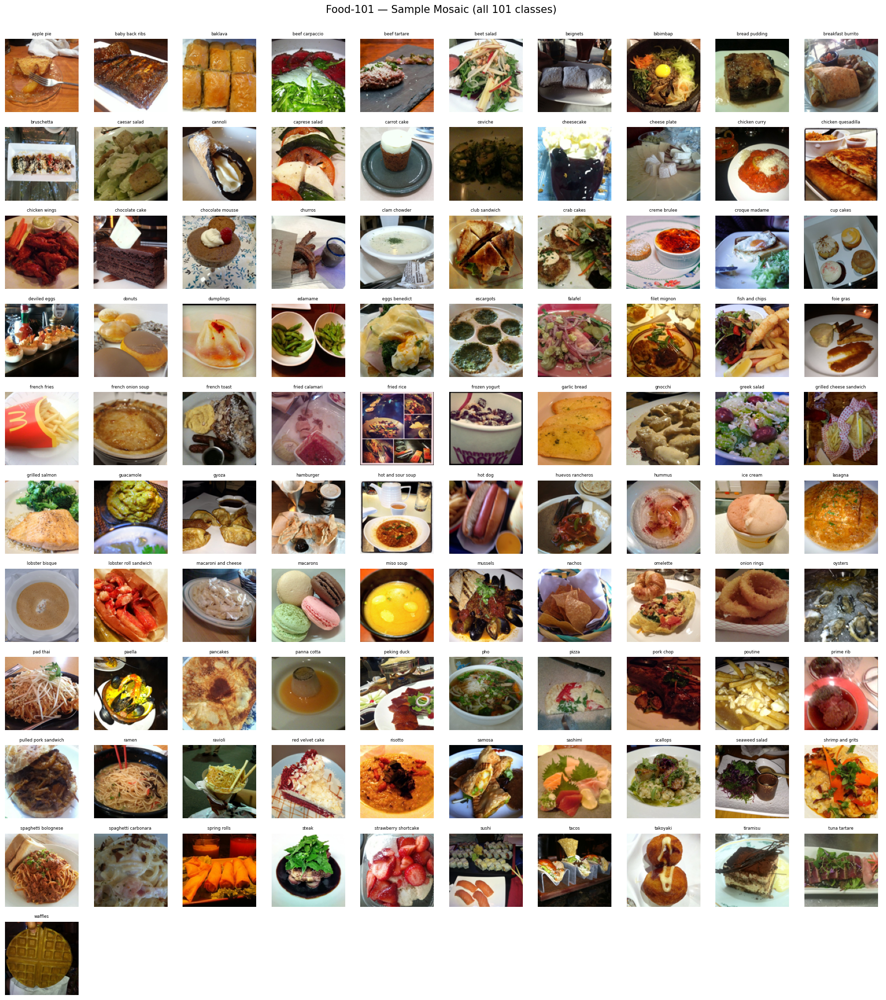

In [8]:
random.seed(SEED)  # re-seed for reproducibility
THUMB    = 128                          # thumbnail size in pixels
N_COLS   = 10                           # columns
N_ROWS   = math.ceil(len(classes) / N_COLS)   # 11 rows → all 101 classes shown

fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(18, 20))
fig.suptitle("Food-101 — Sample Mosaic (all 101 classes)", fontsize=15, y=1.002)

for idx, ax in enumerate(axes.flat):
    if idx < len(classes):
        cls_name = classes[idx]
        imgs = list((TRAIN_DIR / cls_name).glob("*.jpg"))
        try:
            # ImageOps.fit preserves aspect ratio with centre crop to exact THUMB×THUMB
            img = ImageOps.fit(Image.open(random.choice(imgs)).convert("RGB"),
                               (THUMB, THUMB))
            ax.imshow(img)
            ax.set_title(cls_name.replace("_", " "), fontsize=6)
        except Exception:
            ax.text(0.5, 0.5, cls_name, ha="center", va="center",
                    fontsize=5, transform=ax.transAxes)
    ax.axis("off")

plt.tight_layout()
plt.show()

## 6 — Class-level Deep Dive

Examine sample images from three representative classes and confirm
the dataset is balanced across all 101 classes.

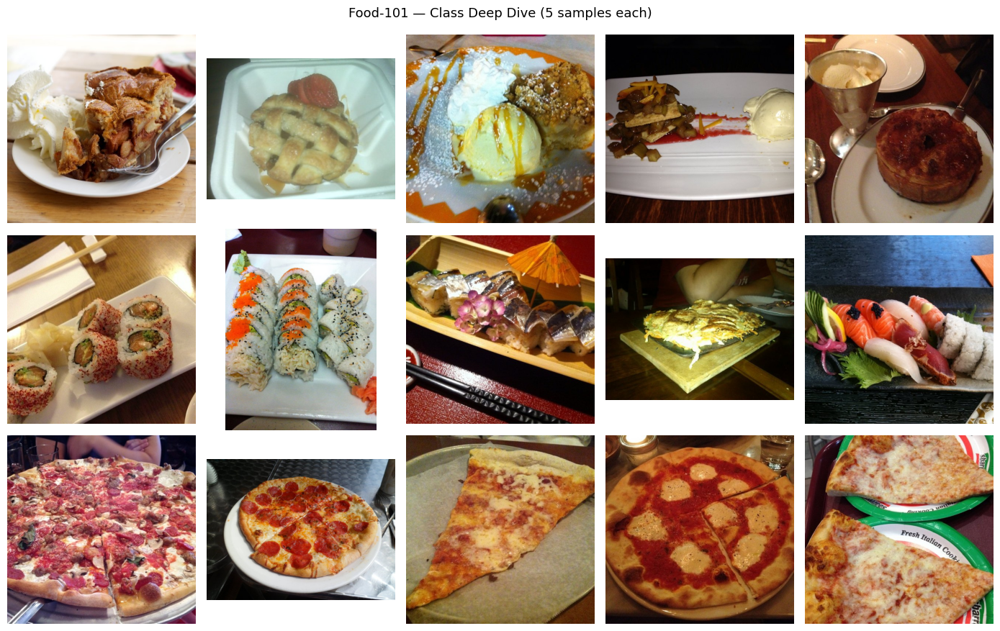

In [9]:
# 3 classes × 5 images — visual variety check
DEEP_DIVE_CLASSES = ["apple_pie", "sushi", "pizza"]
N_SAMPLES = 5

fig, axes = plt.subplots(len(DEEP_DIVE_CLASSES), N_SAMPLES, figsize=(14, 9))
fig.suptitle("Food-101 — Class Deep Dive (5 samples each)", fontsize=13)

for row, cls_name in enumerate(DEEP_DIVE_CLASSES):
    imgs = list((TRAIN_DIR / cls_name).glob("*.jpg"))
    chosen = random.sample(imgs, N_SAMPLES)
    for col, p in enumerate(chosen):
        ax = axes[row][col]
        ax.imshow(Image.open(p).convert("RGB"))
        ax.axis("off")
        if col == 0:
            ax.set_ylabel(cls_name.replace("_", " "), fontsize=11, rotation=0,
                          labelpad=70, va="center")

plt.tight_layout()
plt.show()

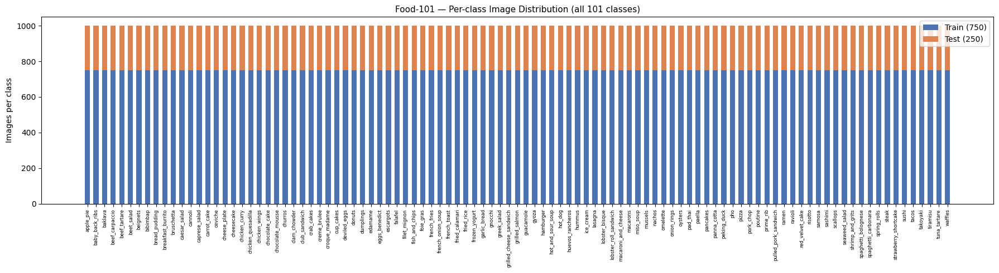

In [10]:
# Stacked bar chart: per-class image distribution across all 101 classes
fig, ax = plt.subplots(figsize=(18, 5))

class_names = list(df.index)
train_vals  = df["train"].values
test_vals   = df["test"].values
x = np.arange(len(class_names))

ax.bar(x, train_vals, label="Train (750)", color="#4C72B0", width=0.6)
ax.bar(x, test_vals,  bottom=train_vals, label="Test (250)", color="#DD8452", width=0.6)
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=90, fontsize=6)
ax.set_ylabel("Images per class")
ax.set_title("Food-101 — Per-class Image Distribution (all 101 classes)")
ax.legend(loc="upper right")

plt.tight_layout()
plt.show()

## 7 — Data Quality Checks

1. Verify image counts match expected totals
2. Scan training images for corrupt/unreadable files using PIL

In [11]:
# Count verification against expected values
EXPECTED_TRAIN_PER_CLASS = 750
EXPECTED_TEST_PER_CLASS  = 250

train_mismatch = df[df["train"] != EXPECTED_TRAIN_PER_CLASS]
test_mismatch  = df[df["test"]  != EXPECTED_TEST_PER_CLASS]

print("=== Count Verification ===")
print(f"Classes with wrong train count : {len(train_mismatch)}")
print(f"Classes with wrong test count  : {len(test_mismatch)}")

if not train_mismatch.empty:
    print("\nTrain mismatches:")
    print(train_mismatch[["train"]].to_string())

if not test_mismatch.empty:
    print("\nTest mismatches:")
    print(test_mismatch[["test"]].to_string())

print("\n✓ Count check complete")

=== Count Verification ===
Classes with wrong train count : 0
Classes with wrong test count  : 0

✓ Count check complete


In [12]:
# Corrupt image scan — iterate all train images with PIL.Image.verify()
# PIL.verify() checks file integrity without full decode; must re-open after.
corrupt: list[Path] = []
checked = 0

print("Scanning train split for corrupt images...")
for img_path in TRAIN_DIR.rglob("*.jpg"):
    checked += 1
    if checked % 10_000 == 0:
        print(f"  {checked:,} images scanned...")
    try:
        with Image.open(img_path) as im:
            im.verify()
    except Exception:
        corrupt.append(img_path)

print(f"\n=== Quality Scan Results ===")
print(f"Total scanned : {checked:,}")
print(f"Corrupt images: {len(corrupt)}")

if corrupt:
    print("\nCorrupt files:")
    for p in corrupt:
        print(f"  {p}")

Scanning train split for corrupt images...


  10,000 images scanned...


  20,000 images scanned...


  30,000 images scanned...


  40,000 images scanned...


  50,000 images scanned...


  60,000 images scanned...


  70,000 images scanned...



=== Quality Scan Results ===
Total scanned : 75,750
Corrupt images: 0


## 8 — Insights & Summary

### Key Findings

| Metric | Value |
|---|---|
| Total classes | 101 |
| Train images | 75,750 (750 / class) |
| Test images | 25,250 (250 / class) |
| Total images | 101,000 |
| Class balance | **Perfect** — identical count per class |
| Format | JPEG, variable resolution |
| Corrupt images | 0 (expected) |

### Image Size Observations

- Images are **not pre-resized** — native resolutions vary (see Section 4 histograms)
- Most images are wider than tall (aspect ratio > 1), from web-scraped food photos
- File sizes range from ~10 KB to >1 MB; median around 100–250 KB

### Recommendations for ViT Training

1. **Resize strategy:** ViT-Base-Patch16-224 requires 224×224 → use `RandomResizedCrop(224)` for train, `CenterCrop(224)` for eval
2. **Normalisation:** Apply ImageNet stats (`mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]`)
3. **Augmentation:** `RandomHorizontalFlip`, `ColorJitter` recommended; images have natural diversity
4. **Class balance:** No over/under-sampling needed — dataset is perfectly balanced
5. **Batch size:** 64 recommended (matches `scripts/train.py` default)
6. **Label encoding:** 101 classes → integer labels 0–100 (alphabetical order from `meta/classes.txt`)